In [ ]:
import pandas as pd
import numpy as np


df = pd.read_csv("/content/df_sorted.csv")


# Feature Engineering

In [ ]:
#  Convert date columns to datetime
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
df['First Purchase Date'] = pd.to_datetime(df['First Purchase Date'], errors='coerce')
df['Last Purchase Date'] = pd.to_datetime(df['Last Purchase Date'], errors='coerce')
df['Release Date'] = pd.to_datetime(df['Release Date'], errors='coerce')

In [ ]:
# Temporal Features
df['year'] = df['Date'].dt.year
df['month'] = df['Date'].dt.month
df['day'] = df['Date'].dt.day
df['weekday'] = df['Date'].dt.dayofweek
df['is_weekend'] = df['weekday'].isin([5, 6]).astype(int)


In [ ]:
# Customer Loyalty Bins
df['customer_loyalty'] = pd.cut(df['Lifespan'], bins=[-1, 30, 180, np.inf], labels=['New', 'Medium', 'Loyal'])


In [ ]:
# Derived Time Features
df['days_since_first'] = (df['Date'] - df['First Purchase Date']).dt.days
df['days_until_last'] = (df['Last Purchase Date'] - df['Date']).dt.days
df['customer_activity_span'] = (df['Last Purchase Date'] - df['First Purchase Date']).dt.days

In [ ]:
# Revenue Features
df['Revenue_per_Quantity'] = df['Total Revenue'] / df['Quantity']
df['Profit'] = df['Total Revenue'] - df['Cost of Goods Sold']
df['Margin_pct'] = df['Profit'] / df['Total Revenue']

In [ ]:
# Fill Missing Values
product_cols = ['Description', 'Product Brand', 'Product Class', 'Product Category', 'Item Class', 'Marketing Channel']
df[product_cols] = df[product_cols].fillna('Unknown')


In [ ]:
# Encode Country
df['Country_Code'] = df['Country'].astype('category').cat.codes
df['State_Code'] = df['State'].astype('category').cat.codes

In [ ]:
# Clean column names: strip spaces and standardize formatting
df.columns = df.columns.str.strip().str.replace(' ', '_').str.lower()


In [ ]:
df

,customer_id,state,postal_code,country,first_purchase_date,last_purchase_date,lifespan,date,transaction_id,marketing_channel,...,is_weekend,customer_loyalty,days_since_first,days_until_last,customer_activity_span,revenue_per_quantity,profit,margin_pct,country_code,state_code
0,2,hi,96704,united states,2023-08-05,2024-08-12,374,2024-05-20,HHUSOR202461981,Email/SMS,...,0,Loyal,289,84,373,14.99,NaN,NaN,73,75
1,2,hi,96704,united states,2023-08-05,2024-08-12,374,2024-05-20,HHUSOR202461981,Email/SMS,...,0,Loyal,289,84,373,23.99,42.67,0.889329,73,75
2,2,hi,96704,united states,2023-08-05,2024-08-12,374,2024-05-20,HHUSOR202461981,Email/SMS,...,0,Loyal,289,84,373,23.99,42.67,0.889329,73,75
3,7,il,62704,united states,2023-08-30,2023-08-30,1,2023-03-02,HHUSOR201190141,Unknown,...,0,New,-181,181,0,169.99,106.37,0.625743,73,81
4,7,il,62704,united states,2023-08-30,2023-08-30,1,2023-03-29,HHUSOR201278675,Email/SMS,...,0,New,-154,154,0,94.99,44.67,0.470260,73,81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
592236,434109,ca,92115,united states,2024-08-30,2024-08-30,1,2024-08-30,HHUSOR202711682,Other,...,0,New,0,0,0,179.99,88.13,0.489638,73,25
592237,434113,ca,95662,united states,2024-08-30,2024-08-30,1,2024-08-30,HHUSOR202711686,Unknown,...,0,New,0,0,0,9.99,8.68,0.868869,73,25
592238,434113,ca,95662,united states,2024-08-30,2024-08-30,1,2024-08-30,HHUSOR202711686,Unknown,...,0,New,0,0,0,22.99,15.23,0.662462,73,25
592239,434113,ca,95662,united states,2024-08-30,2024-08-30,1,2024-08-30,HHUSOR202711686,Unknown,...,0,New,0,0,0,99.99,53.14,0.531453,73,25


# Loyalty group assignment

In [ ]:

# Create loyalty segment columns using one-hot encoding if they don't exist
loyalty_segments = ['New', 'Medium', 'Loyal']
if not all(col in df.columns for col in ['loyalty_' + seg.lower() for seg in loyalty_segments]):
    for seg in loyalty_segments:
        df['loyalty_' + seg.lower()] = (df['customer_loyalty'] == seg).astype(int)

loyalty_cols = ['loyalty_new', 'loyalty_medium', 'loyalty_loyal']
df['loyalty_segment'] = df[loyalty_cols].idxmax(axis=1).str.replace('loyalty_', '')

# Revenue analysis by loyalty segment
loyalty_summary = df.groupby('loyalty_segment')['total_revenue'].agg(['sum', 'mean', 'count']).reset_index()
print("📊 Customer Segmentation by Loyalty:")
print(loyalty_summary)

📊 Customer Segmentation by Loyalty:
  loyalty_segment           sum       mean   count
0           loyal  1.378766e+07  59.449294  231923
1          medium  9.167247e+06  62.459101  146772
2             new  1.431348e+07  67.032346  213531


In [ ]:
# Multiply one-hot encoded marketing columns with total revenue
channel_cols = [col for col in df.columns if col.startswith('channel_')]
channel_revenue = {}

for col in channel_cols:
    revenue_col = col + '_revenue'
    df[revenue_col] = df[col] * df['total_revenue']
    channel_revenue[col.replace('channel_', '').replace('_', ' ').title()] = df[revenue_col].sum()

# Convert to sorted DataFrame
channel_revenue_df = pd.DataFrame(list(channel_revenue.items()), columns=['Marketing Channel', 'Total Revenue'])
channel_revenue_df = channel_revenue_df.sort_values(by='Total Revenue', ascending=False)

print("📢 Marketing Channel Revenue Contribution:")
print(channel_revenue_df)


📢 Marketing Channel Revenue Contribution:
Empty DataFrame
Columns: [Marketing Channel, Total Revenue]
Index: []


#  Top 10 categories


In [ ]:
category_perf = df.groupby('product_category')[['total_revenue', 'profit']].sum().sort_values(by='total_revenue', ascending=False).reset_index()

print("📦 Product Category Performance:")
print(category_perf.head(10))

📦 Product Category Performance:
  product_category  total_revenue       profit
0              Air   1.309458e+07  7216923.640
1          Surface   9.968002e+06  5038766.200
2            Radio   5.173049e+06  3499027.730
3             Accy   5.057846e+06  3385309.634
4           RC - D   2.657115e+06  1196053.350
5          Unknown   1.137624e+06        0.000
6        Train - P   1.173862e+05    80502.730
7        Other - D   6.162692e+04    39198.670
8        Train - D   1.164490e+03      186.650


In [ ]:
customer_value = df.groupby('customer_id')['total_revenue'].sum().sort_values(ascending=False).head(10).reset_index()
customer_value.columns = ['Customer ID', 'Total Revenue']

print("💎 Top 10 High-Value Customers:")
print(customer_value)


💎 Top 10 High-Value Customers:
   Customer ID  Total Revenue
0       115106      158401.57
1         3642       43118.44
2       118656       39154.16
3        11152       37142.15
4        16862       36634.03
5         1620       29236.20
6        27391       28666.24
7       244034       27723.82
8       173872       25533.34
9        19348       23609.89


<ipython-input-40-20ad0fbed722>:12: UserWarning: Glyph 128197 (\N{CALENDAR}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128197 (\N{CALENDAR}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


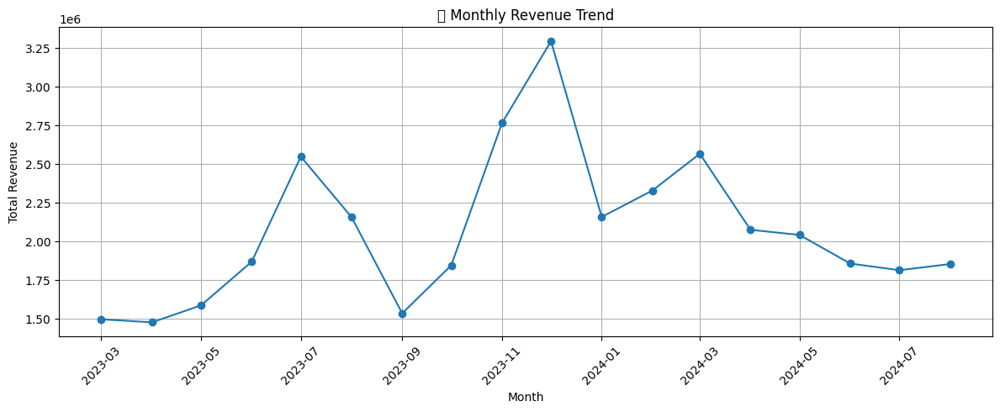

In [ ]:
monthly_revenue = df.groupby(['year', 'month'])['total_revenue'].sum().reset_index()
monthly_revenue['date'] = pd.to_datetime(monthly_revenue[['year', 'month']].assign(day=1))

import matplotlib.pyplot as plt
plt.figure(figsize=(12, 5))
plt.plot(monthly_revenue['date'], monthly_revenue['total_revenue'], marker='o')
plt.title("📅 Monthly Revenue Trend")
plt.xlabel("Month")
plt.ylabel("Total Revenue")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
monthly_revenue = df.groupby(['year', 'month'])['total_revenue'].sum().reset_index()
monthly_revenue['date'] = pd.to_datetime(monthly_revenue[['year', 'month']].assign(day=1))


In [ ]:
!pip install prophet --quiet

import pandas as pd
import matplotlib.pyplot as plt
from prophet import Prophet


In [ ]:
# Use 'to_period' to avoid column name conflicts
df['month_period'] = df['date'].dt.to_period('M')
monthly_revenue = df.groupby('month_period')['total_revenue'].sum().reset_index()

# Convert period to datetime format for Prophet
monthly_revenue['ds'] = monthly_revenue['month_period'].dt.to_timestamp()
monthly_revenue = monthly_revenue.rename(columns={'total_revenue': 'y'})

# Drop the period column (optional)
monthly_revenue = monthly_revenue[['ds', 'y']]
monthly_revenue.tail()


,ds,y
13,2024-04-01,2075097.82
14,2024-05-01,2041850.19
15,2024-06-01,1856932.62
16,2024-07-01,1814085.83
17,2024-08-01,1853661.30


In [ ]:
# Initialize and train model
model = Prophet()
model.fit(monthly_revenue)

# Create future dates for next 6 months
future = model.make_future_dataframe(periods=6, freq='M')

# Predict
forecast = model.predict(future)


INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:prophet:n_changepoints greater than number of observations. Using 13.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpakgi_yyp/dpcgu_yl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpakgi_yyp/n68bd2h2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62588', 'data', 'file=/tmp/tmpakgi_yyp/dpcgu_yl.json', 'init=/tmp/tmpakgi_yyp/n68bd2h2.json', 'output', 'file=/tmp/tmpakgi_yyp/prophet_model7xb0xutu/prophet_model-20250516015801.csv', 'method=optimize', 'algorithm=newton', 'iter=10000']
01:58:01 - cmdstanpy - INFO - Chain [1] start processing
I

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128197 (\N{CALENDAR}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


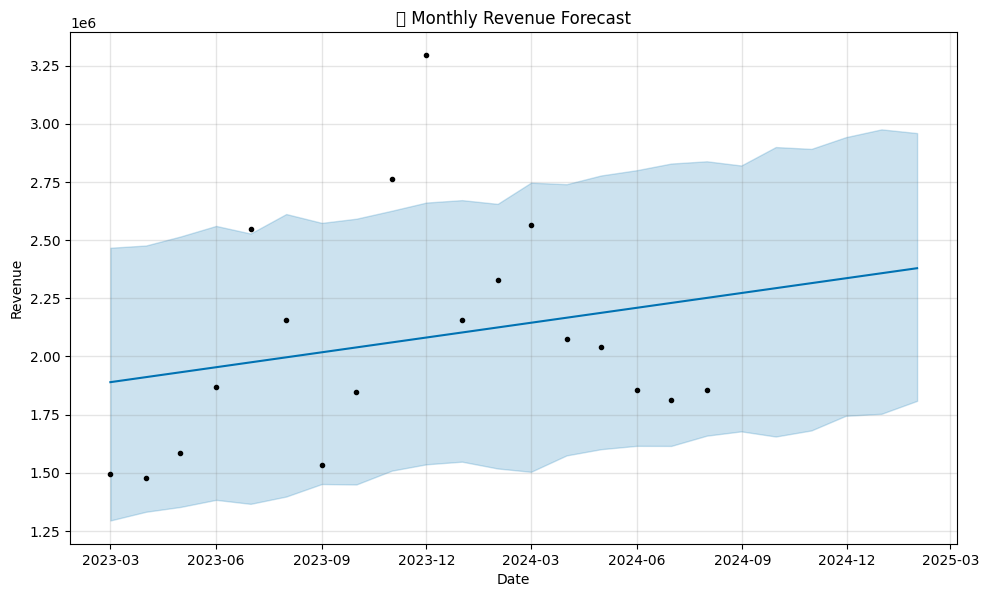

In [ ]:
# Plot forecast
fig = model.plot(forecast)
plt.title("📅 Monthly Revenue Forecast")
plt.xlabel("Date")
plt.ylabel("Revenue")
plt.grid(True)
plt.show()


In [ ]:
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(6)


,ds,yhat,yhat_lower,yhat_upper
18,2024-08-31,2.272268e+06,1.677798e+06,2.820419e+06
19,2024-09-30,2.293195e+06,1.655609e+06,2.899703e+06
20,2024-10-31,2.314820e+06,1.681768e+06,2.891786e+06
21,2024-11-30,2.335748e+06,1.744829e+06,2.942128e+06
22,2024-12-31,2.357373e+06,1.753317e+06,2.975680e+06
23,2025-01-31,2.378998e+06,1.808920e+06,2.959755e+06


In [ ]:
import pandas as pd
import numpy as np

# Step 1: Get last transaction date in the dataset
last_date = df['date'].max()

# Step 2: Define churn cutoff (e.g., 60 days of inactivity = churned)
cutoff_days = 60

# Step 3: Compute last purchase per customer
last_purchase = df.groupby('customer_id')['date'].max().reset_index()
last_purchase.columns = ['customer_id', 'last_txn_date']
last_purchase['days_since_last'] = (last_date - last_purchase['last_txn_date']).dt.days

# Step 4: Label churned customers
last_purchase['churned'] = (last_purchase['days_since_last'] > cutoff_days).astype(int)


In [ ]:
# Revenue and frequency stats
agg = df.groupby('customer_id').agg({
    'total_revenue': ['sum', 'mean'],
    'transaction_id': 'nunique',
    'days_since_first': 'max',
    'customer_activity_span': 'max',
    'date': 'max'
}).reset_index()

# Rename columns
agg.columns = ['customer_id', 'total_rev', 'avg_rev', 'txn_count', 'days_since_first', 'activity_span', 'last_txn_date']

# Merge with churn labels
agg = pd.merge(agg, last_purchase[['customer_id', 'days_since_last', 'churned']], on='customer_id', how='left')

# Drop last_txn_date (not needed now)
agg = agg.drop(columns=['last_txn_date'])


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

# Features & target
X = agg.drop(['customer_id', 'churned'], axis=1)
y = agg['churned']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Logistic Regression
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Evaluation
y_pred = model.predict(X_test)
print("📊 Classification Report:")
print(classification_report(y_test, y_pred))
print("ROC AUC Score:", roc_auc_score(y_test, model.predict_proba(X_test)[:,1]))


📊 Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3495
           1       1.00      1.00      1.00     16957

    accuracy                           1.00     20452
   macro avg       1.00      1.00      1.00     20452
weighted avg       1.00      1.00      1.00     20452

ROC AUC Score: 1.0


In [ ]:
agg['churn_risk_score'] = model.predict_proba(X)[:,1]
at_risk = agg[agg['churned'] == 0].sort_values(by='churn_risk_score', ascending=False).head(10)
print("🚨 Top 10 At-Risk Customers to Retain:")
print(at_risk[['customer_id', 'churn_risk_score', 'total_rev', 'txn_count']])


🚨 Top 10 At-Risk Customers to Retain:
       customer_id  churn_risk_score  total_rev  txn_count
94823       396270          0.032335      73.14          1
94923       396791          0.032205     316.93          1
94865       396516          0.032204       5.97          1
94877       396582          0.032195      58.93          1
94867       396528          0.032184      35.94          1
94885       396628          0.032181      38.94          1
94828       396295          0.032172       7.85          1
94943       396878          0.032158      18.31          1
94807       396202          0.032156      18.87          1
94788       396113          0.032143      11.98          1


In [ ]:
!pip install lifetimes --quiet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 584.2/584.2 kB 5.3 MB/s eta 0:00:00


In [ ]:
from lifetimes.utils import summary_data_from_transaction_data

# RFM summary from raw transactions
rfm = summary_data_from_transaction_data(df,
                                         customer_id_col='customer_id',
                                         datetime_col='date',
                                         monetary_value_col='total_revenue',
                                         observation_period_end=df['date'].max())

rfm = rfm[rfm['frequency'] > 0]  # Remove one-time buyers
rfm.head()


,frequency,recency,T,monetary_value
customer_id,,,,
7,2.0,181.0,548.0,175.245000
15,2.0,18.0,521.0,0.000000
21,2.0,129.0,494.0,31.985000
22,12.0,173.0,541.0,174.908333
31,11.0,147.0,514.0,194.714545


In [ ]:
from lifetimes import BetaGeoFitter

bgf = BetaGeoFitter(penalizer_coef=0.001)
bgf.fit(rfm['frequency'], rfm['recency'], rfm['T'])

# Predict purchases in next 3 months (~90 days)
rfm['predicted_purchases_3m'] = bgf.conditional_expected_number_of_purchases_up_to_time(
    90, rfm['frequency'], rfm['recency'], rfm['T']
)


In [ ]:
# Remove invalid monetary values
rfm_filtered = rfm[(rfm['monetary_value'] > 0)]

# Fit Gamma-Gamma model
from lifetimes import GammaGammaFitter

ggf = GammaGammaFitter(penalizer_coef=0.001)
ggf.fit(rfm_filtered['frequency'], rfm_filtered['monetary_value'])

# Predict average revenue per transaction
rfm_filtered['predicted_avg_revenue'] = ggf.conditional_expected_average_profit(
    rfm_filtered['frequency'], rfm_filtered['monetary_value']
)


In [ ]:
rfm_filtered['cltv_3m'] = rfm_filtered['predicted_purchases_3m'] * rfm_filtered['predicted_avg_revenue']


In [ ]:
# Multiply expected frequency and expected average revenue
rfm_filtered['cltv_3m'] = rfm_filtered['predicted_purchases_3m'] * rfm_filtered['predicted_avg_revenue']

# Top 10 customers by CLTV
top_cltv = rfm_filtered.sort_values(by='cltv_3m', ascending=False).head(10)

print("💎 Top 10 Customers by CLTV (3 months):")
print(top_cltv[['cltv_3m', 'predicted_purchases_3m', 'predicted_avg_revenue']])


💎 Top 10 Customers by CLTV (3 months):
                 cltv_3m  predicted_purchases_3m  predicted_avg_revenue
customer_id                                                            
3642         5845.031521               19.527357             299.325279
410929       5412.360975                4.017432            1347.218940
16862        5261.243251               15.721415             334.654570
118656       4969.287166                5.944776             835.908174
254983       4935.129156                0.819698            6020.669961
244034       4279.545459                2.133746            2005.648754
19348        3403.377057                5.805421             586.241202
173872       3020.292813                1.460510            2067.971513
425572       2767.215584                1.472020            1879.876309
2103         2388.705024                9.656345             247.371558


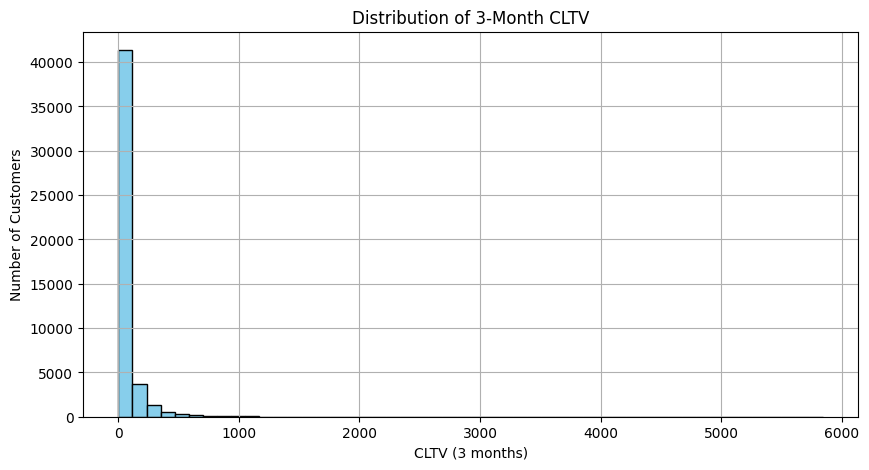

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.hist(rfm_filtered['cltv_3m'], bins=50, color='skyblue', edgecolor='black')
plt.title("Distribution of 3-Month CLTV")
plt.xlabel("CLTV (3 months)")
plt.ylabel("Number of Customers")
plt.grid(True)
plt.show()


In [ ]:
import pandas as pd

# === Step 1: Load and Prepare the Data ===
# Assuming `df` is your main DataFrame and includes 'customer_id', 'product_category', and 'revenue_per_quantity'

# Handle missing revenue (fallback to frequency if needed)
df['revenue_per_quantity'] = pd.to_numeric(df['revenue_per_quantity'], errors='coerce').fillna(0)

# === Step 2: Compute Global Popularity (based on revenue) ===
product_popularity = (
    df.groupby('product_category')
    .agg(total_revenue=('revenue_per_quantity', 'sum'),
         purchase_count=('product_category', 'count'))
    .reset_index()
    .sort_values(by='total_revenue', ascending=False)
)

# Select sum(tota_revenue) from df group by product_id order by total_revenue limit 10

# Top N products
TOP_N = 5
top_products = product_popularity['product_category'].head(TOP_N).tolist()

# === Step 3: Baseline Recommender Function ===
def baseline_recommender(customer_id=None, n=TOP_N):
    """
    Returns the top N globally popular products.
    This is a non-personalized baseline recommender.
    """
    return top_products[:n]

# Example: Show top 5 recommended products
print("🔝 Top Products (Global Popularity Baseline):")
print(baseline_recommender())


🔝 Top Products (Global Popularity Baseline):
['Air', 'Surface', 'Radio', 'Accy', 'RC - D']


Baseline Model

In [ ]:
# === Step 4: Evaluate Hit Rate ===

# Step 4a: Actual products per customer
actual_purchases = df.groupby('customer_id')['product_category'].apply(set)

# Step 4b: Predicted products per customer using baseline
predicted = {cid: set(baseline_recommender(cid)) for cid in actual_purchases.index}

# Step 4c: Calculate Hit Rate
hits = sum(len(actual_purchases[cid] & predicted[cid]) > 0 for cid in actual_purchases.index)
hit_rate = hits / len(actual_purchases)

print(f"🎯 Hit Rate (Baseline): {hit_rate:.2%}")


🎯 Hit Rate (Baseline): 98.70%


In [ ]:
# === Step 1: Popularity by Channel ===
channel_popularity = (
    df.groupby(['marketing_channel', 'product_category'])
    .agg(total_revenue=('revenue_per_quantity', 'sum'))
    .reset_index()
)

channel_top_products = (
    channel_popularity
    .sort_values(['marketing_channel', 'total_revenue'], ascending=[True, False])
    .groupby('marketing_channel')['product_category']
    .apply(lambda x: x.head(TOP_N).tolist())
    .to_dict()
)

# === Step 2: Channel-Based Recommender ===
def channel_based_recommender(customer_id, channel, n=TOP_N):
    return channel_top_products.get(channel, top_products[:n])

print(channel_based_recommender(customer_id='C123', channel='Email', n=TOP_N))



['Air', 'Surface', 'Radio', 'Accy', 'RC - D']


In [ ]:
# === Step 1: Define Customer Segments ===
# You can define "loyal" as customers with > X purchases or revenue

customer_stats = (
    df.groupby('customer_id')
    .agg(total_orders=('product_category', 'count'),
         total_revenue=('revenue_per_quantity', 'sum'))
)

def classify_segment(row):
    if row['total_orders'] >= 10:
        return 'Loyal'
    elif row['total_orders'] <= 2:
        return 'New'
    else:
        return 'Medium'

customer_stats['segment'] = customer_stats.apply(classify_segment, axis=1)
customer_segments = customer_stats['segment'].to_dict()

# === Step 2: Popularity per Segment ===
df['segment'] = df['customer_id'].map(customer_segments)

segment_popularity = (
    df.groupby(['segment', 'product_category'])
    .agg(total_revenue=('revenue_per_quantity', 'sum'))
    .reset_index()
)

segment_top_products = (
    segment_popularity
    .sort_values(['segment', 'total_revenue'], ascending=[True, False])
    .groupby('segment')['product_category']
    .apply(lambda x: x.head(TOP_N).tolist())
    .to_dict()
)

# === Step 3: Segment-Based Recommender ===
def segment_based_recommender(customer_id, n=TOP_N):
    segment = customer_segments.get(customer_id, 'Medium')  # Default to Medium
    return segment_top_products.get(segment, top_products[:n])

print(segment_based_recommender(customer_id='C123', n=TOP_N))



['Air', 'Surface', 'Radio', 'Accy', 'RC - D']


In [ ]:
 # Step 1: Define Customer Segments ===
# You can define "loyal" as customers with > X purchases or revenue

customer_stats = (
    df.groupby('customer_id')
    .agg(total_orders=('product_category', 'count'),
         total_revenue=('revenue_per_quantity', 'sum'))
)

def classify_segment(row):
    if row['total_orders'] >= 10:
        return 'Loyal'
    elif row['total_orders'] <= 2:
        return 'New'
    else:
        return 'Medium'

customer_stats['segment'] = customer_stats.apply(classify_segment, axis=1)
customer_segments = customer_stats['segment'].to_dict()

# === Step 2: Popularity per Segment ===
df['segment'] = df['customer_id'].map(customer_segments)

segment_popularity = (
    df.groupby(['segment', 'product_category'])
    .agg(total_revenue=('revenue_per_quantity', 'sum'))
    .reset_index()
)

segment_top_products = (
    segment_popularity
    .sort_values(['segment', 'total_revenue'], ascending=[True, False])
    .groupby('segment')['product_category']
    .apply(lambda x: x.head(TOP_N).tolist())
    .to_dict()
)

# === Step 3: Segment-Based Recommender ===
def segment_based_recommender(customer_id, n=TOP_N):
    segment = customer_segments.get(customer_id, 'Medium')  # Default to Medium
    return segment_top_products.get(segment, top_products[:n])

print(segment_based_recommender(customer_id='C123', n=TOP_N))



['Air', 'Surface', 'Radio', 'Accy', 'RC - D']


# COllaborative filtering

In [ ]:
import pandas as pd
import numpy as np

# Assuming df is already loaded and has 'customer_id', 'product_category', 'revenue_per_quantity'

# Step 1: Prepare the user-item interaction matrix
df['item_id'] = df['product_brand'].astype(str) + '_' + df['product_class'].astype(str) + '_' + df['product_category'].astype(str) + '_' + df['item_class'].astype(str)

user_item_matrix = df.pivot_table(index='customer_id', columns='item_id', values='revenue_per_quantity', aggfunc='sum', fill_value=0)

# Preview the user-item matrix
user_item_matrix.head()


item_id,AKA_Proprietary_Accy_Adhesives,AKA_Proprietary_Accy_Apparel,AKA_Proprietary_Accy_Body & Wings,AKA_Proprietary_Accy_Parts,AKA_Proprietary_Accy_Tire,AKA_Proprietary_Accy_Tools,ALC_Distributed_Other - D_Paint,APC_Distributed_RC - D_Parts,APC_Distributed_RC - D_Propeller,APC_Distributed_RC - D_Spinner,...,VPS_Distributed_RC - D_Parts,VPS_Distributed_RC - D_Tire,VPS_Distributed_RC - D_Tools,VTR_Proprietary_Surface_Body & Wings,VTR_Proprietary_Surface_Parts,WGT_Distributed_RC - D_Parts,WSD_Distributed_RC - D_Battery,WSD_Distributed_RC - D_Parts,XUR_Distributed_Train - D_Tools,ZEN_Proprietary_Air_Parts
customer_id,,,,,,,,,,,,,,,,,,,,,
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
22,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
(user_item_matrix>0).astype(int)
user_item_matrix.iloc[:10,:].T

customer_id,2,7,15,21,22,31,33,35,36,45
item_id,,,,,,,,,,
AKA_Proprietary_Accy_Adhesives,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AKA_Proprietary_Accy_Apparel,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AKA_Proprietary_Accy_Body & Wings,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AKA_Proprietary_Accy_Parts,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
AKA_Proprietary_Accy_Tire,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
WGT_Distributed_RC - D_Parts,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
WSD_Distributed_RC - D_Battery,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
WSD_Distributed_RC - D_Parts,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# Step 2: Install the 'implicit' library (if you haven't already)
!pip install implicit


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 31.2 MB/s eta 0:00:00


# ALS based factorization method

In [ ]:
# product_id_map={k:v for v,k in enumerate(df['product_category'].unique())}
# product_id_map
# df['product_id']=df['product_category'].map(product_id_map)
# df[['product_id','customer_id']+['transaction_id', 'transaction_number']]
df['item_id'] = df['product_brand'].astype(str) + '_' + df['product_class'].astype(str) + '_' + df['product_category'].astype(str) + '_' + df['item_class'].astype(str)

# [i for i in df.columns if 'trans' in i.lower()]

In [ ]:
user_item_matrix = df.pivot_table(index='customer_id', columns='item_id', values='revenue_per_quantity', aggfunc='sum', fill_value=0)
user_item_tn_matrix=df.groupby(['customer_id','item_id'])['transaction_id'].count().reset_index()
user_item_tn_matrix.values

user_ids = user_item_tn_matrix['customer_id'].values
item_ids = user_item_tn_matrix['item_id'].values
data_vals = user_item_tn_matrix['transaction_id'].values

In [ ]:
from scipy.sparse import coo_matrix
from implicit.als import AlternatingLeastSquares

unique_users = np.unique(user_ids)
unique_items = np.unique(item_ids)
user_map = {u: i for i, u in enumerate(unique_users)}
item_map = {i_: j for j, i_ in enumerate(unique_items)}

mapped_users = np.array([user_map[u] for u in user_ids])
mapped_items = np.array([item_map[i_] for i_ in item_ids])

num_users = len(unique_users)
num_items = len(unique_items)

# # Build sparse matrix of shape (items, users)
# item_user_mat = coo_matrix(
#     (data_vals, (mapped_items, mapped_users)),
#     shape=(num_items, num_users)
# )


item_user_mat = coo_matrix(
    (data_vals, (mapped_users, mapped_items)),
    shape=(num_users, num_items)
)
# Convert to CSR for fast row slicing
# user_items = item_user_mat.T.tocsr()
user_items = item_user_mat.tocsr()



In [ ]:
# Initialize ALS model
factors=20
regularization=0.1
iterations=15
alpha=40


model = AlternatingLeastSquares(
    factors=factors,
    regularization=regularization,
    iterations=iterations,
    use_gpu=False
)




confidence = (item_user_mat * alpha).astype('double')
model.fit(confidence)

# Create inverse maps
inv_user_map = {v: k for k, v in user_map.items()}
inv_item_map = {v: k for k, v in item_map.items()}




/usr/local/lib/python3.11/dist-packages/implicit/cpu/als.py:95: RuntimeWarning: OpenBLAS is configured to use 2 threads. It is highly recommended to disable its internal threadpool by setting the environment variable 'OPENBLAS_NUM_THREADS=1' or by calling 'threadpoolctl.threadpool_limits(1, "blas")'. Having OpenBLAS use a threadpool can lead to severe performance issues here.
  check_blas_config()
/usr/local/lib/python3.11/dist-packages/implicit/utils.py:164: ParameterWarning: Method expects CSR input, and was passed coo_matrix instead. Converting to CSR took 0.014469146728515625 seconds
  warnings.warn(


  0%|          | 0/15 [00:00<?, ?it/s]

In [ ]:
user_id_to_recommend = 7

# Check if the user_id exists in the original DataFrame's customer_id column
if user_id_to_recommend not in df['customer_id'].unique():
    print(f"Customer ID {user_id_to_recommend} not found in the dataset.")
else:
    # Get the internal user index from the user_map
    if user_id_to_recommend in user_map:
        user_index = user_map[user_id_to_recommend]

        # Get recommendations from the ALS model
        # We need to provide the item_user matrix to the recommend function
        recommendations = model.recommend(user_index, user_items[0], N=5,filter_already_liked_items=False )

        print(f"\nTop 5 Recommended Products for Customer ID {user_id_to_recommend}:")
        for item_index, score in zip(*recommendations):
            # Get the actual product category name using the inverse item map
            product_category = inv_item_map[item_index]
            print(f"- {product_category} (Score: {score:.4f})")
    else:
        print(f"Customer ID {user_id_to_recommend} not found in the user map used for ALS training.")


Top 5 Recommended Products for Customer ID 7:
- LOS_Proprietary_Surface_Car (Score: 0.9934)
- ARA_Proprietary_Surface_Car (Score: 0.9821)
- TAM_Distributed_RC - D_Car (Score: 0.8563)
- DYN_Proprietary_Accy_Battery (Score: 0.5573)
- TAM_Distributed_RC - D_Parts (Score: 0.5152)


# CONTENT BASED Recommendation
On the basis of product attributes

In [ ]:
#Product to product similarity

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity


# Create a unique list of items with their combined description features
item_features_df = df.drop_duplicates(subset=['item_id']).copy()

# Combine description and categorical features for TF-IDF vectorization
# Using 'description', 'product_brand', 'product_class', 'product_category'
# We'll convert categorical features to strings to be treated as part of the text corpus
item_features_df['combined_features'] = item_features_df['description'].fillna('') + ' ' + \
                                          item_features_df['product_brand'].fillna('').astype(str) + ' ' + \
                                          item_features_df['product_class'].fillna('').astype(str) + ' ' + \
                                          item_features_df['product_category'].fillna('').astype(str) + ' ' + \
                                          item_features_df['item_class'].fillna('').astype(str)

# Use TF-IDF to vectorize the combined features
tfidf = TfidfVectorizer(stop_words='english')
tfidf_matrix = tfidf.fit_transform(item_features_df['combined_features'])

# Compute the cosine similarity matrix
cosine_sim_matrix = cosine_similarity(tfidf_matrix, tfidf_matrix)

# Create a mapping from item_id to index in the matrix
item_id_to_index = {item_id: index for index, item_id in enumerate(item_features_df['item_id'])}
index_to_item_id = {index: item_id for item_id, index in item_id_to_index.items()}

print("Cosine similarity matrix computed.")
print(f"Shape of TF-IDF matrix: {tfidf_matrix.shape}")
print(f"Shape of Cosine Similarity matrix: {cosine_sim_matrix.shape}")

# Example: Find similar items to a specific item_id
def get_content_based_recommendations(item_id, cosine_sim=cosine_sim_matrix, item_map=item_id_to_index, inv_item_map=index_to_item_id, n_recommendations=5):
    """
    Get content-based recommendations for a given item_id.
    """
    if item_id not in item_map:
        return f"Item ID '{item_id}' not found."

    # Get the index of the item that matches the item_id
    idx = item_map[item_id]

    # Get the pairwise similarity scores with that item
    sim_scores = list(enumerate(cosine_sim[idx]))

    # Sort the items based on the similarity scores in descending order
    # Exclude the item itself (similarity score of 1)
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:n_recommendations+1] # Get the top N recommendations

    # Get the item indices and scores
    item_indices = [i[0] for i in sim_scores]
    scores = [i[1] for i in sim_scores]

    # Get the actual item_ids from the indices
    recommended_items = [inv_item_map[i] for i in item_indices]

    return list(zip(recommended_items, scores))

# Example usage with a sample item_id from your data
# You might need to inspect df['item_id'] to find a valid item_id
sample_item_id = df['item_id'].sample(1).iloc[0]
print(f"\nContent-based recommendations for item '{sample_item_id}':")
recommendations = get_content_based_recommendations(sample_item_id)
if isinstance(recommendations, str):
    print(recommendations)
else:
    for item, score in recommendations:
        print(f"- {item} (Similarity: {score:.4f})")


Cosine similarity matrix computed.
Shape of TF-IDF matrix: (445, 1393)
Shape of Cosine Similarity matrix: (445, 445)

Content-based recommendations for item 'Unknown_Unknown_Unknown_Unknown':
- LOS_Proprietary_Surface_Tire (Similarity: 0.0000)
- LOS_Proprietary_Surface_Car (Similarity: 0.0000)
- ARA_Proprietary_Surface_Car (Similarity: 0.0000)
- TAM_Distributed_RC - D_Car (Similarity: 0.0000)
- HHD_Proprietary_Surface_Loyalty & Membership Rewards Program Fees (Similarity: 0.0000)


In [ ]:


# Combine description and categorical features for TF-IDF vectorization
# Using 'description', 'product_brand', 'product_class', 'product_category'
# We'll convert categorical features to strings to be treated as part of the text corpus
item_features_df['combined_features'] = item_features_df['description'].fillna('') + ' ' + \
                                          item_features_df['product_brand'].fillna('').astype(str) + ' ' + \
                                          item_features_df['product_class'].fillna('').astype(str) + ' ' + \
                                          item_features_df['product_category'].fillna('').astype(str) + ' ' + \
                                          item_features_df['item_class'].fillna('').astype(str)

# Use TF-IDF to vectorize the combined features
tfidf = TfidfVectorizer(stop_words='english')
tfidf_matrix = tfidf.fit_transform(item_features_df['combined_features'])

# Compute the cosine similarity matrix
cosine_sim_matrix = cosine_similarity(tfidf_matrix, tfidf_matrix)

# Create a mapping from item_id to index in the matrix
item_id_to_index = {item_id: index for index, item_id in enumerate(item_features_df['item_id'])}
index_to_item_id = {index: item_id for item_id, index in item_id_to_index.items()}

print("Cosine similarity matrix computed.")
print(f"Shape of TF-IDF matrix: {tfidf_matrix.shape}")
print(f"Shape of Cosine Similarity matrix: {cosine_sim_matrix.shape}")

# Function to get content-based recommendations
def get_content_based_recommendations(item_id, cosine_sim=cosine_sim_matrix, item_map=item_id_to_index, inv_item_map=index_to_item_id, n_recommendations=5):
    """
    Get content-based recommendations for a given item_id.
    """
    if item_id not in item_map:
        return f"Item ID '{item_id}' not found."

    # Get the index of the item that matches the item_id
    idx = item_map[item_id]

    # Get the pairwise similarity scores with that item
    sim_scores = list(enumerate(cosine_sim[idx]))

    # Sort the items based on the similarity scores in descending order
    # Exclude the item itself (similarity score of 1)
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:n_recommendations+1] # Get the top N recommendations

    # Get the item indices and scores
    item_indices = [i[0] for i in sim_scores]
    scores = [i[1] for i in sim_scores]

    # Get the actual item_ids from the indices
    recommended_items = [inv_item_map[i] for i in item_indices]

    return list(zip(recommended_items, scores))

# Example usage with a sample item_id from your data
# You might need to inspect df['item_id'] to find a valid item_id
sample_item_id = df['item_id'].sample(1).iloc[0]
print(f"\nContent-based recommendations for item '{sample_item_id}':")
recommendations = get_content_based_recommendations(sample_item_id)
if isinstance(recommendations, str):
    print(recommendations)
else:
    for item, score in recommendations:
        print(f"- {item} (Similarity: {score:.4f})")

# To add customer data for a user-product recommendation without ALS,
# we can leverage the content-based similarity to find items similar
# to those a specific customer has already liked or purchased.

def get_user_content_based_recommendations(customer_id, df, cosine_sim=cosine_sim_matrix, item_map=item_id_to_index, inv_item_map=index_to_item_id, n_recommendations=10):
    """
    Get content-based recommendations for a user based on their purchase history.
    """
    if customer_id not in df['customer_id'].unique():
        return f"Customer ID '{customer_id}' not found in the dataset."

    # Get the items purchased by the customer
    customer_items = df[df['customer_id'] == customer_id]['item_id'].unique()

    # Initialize a dictionary to store combined similarity scores for potential recommendations
    item_scores = {}

    # Iterate through each item the customer has purchased
    for purchased_item in customer_items:
        # Get the index of the purchased item
        if purchased_item in item_map:
            idx = item_map[purchased_item]

            # Get similarity scores for items similar to the purchased item
            sim_scores = list(enumerate(cosine_sim[idx]))

            # Add the similarity score to the potential recommendation's total score
            for item_index, score in sim_scores:
                item_id = inv_item_map[item_index]
                # Avoid recommending items the user has already purchased
                if item_id not in customer_items:
                    if item_id in item_scores:
                        item_scores[item_id] += score
                    else:
                        item_scores[item_id] = score

    # Sort potential recommendations by the accumulated score in descending order
    recommended_items = sorted(item_scores.items(), key=lambda x: x[1], reverse=True)

    # Return the top N recommendations
    return recommended_items[:n_recommendations]

# Example usage with a sample customer_id from your data
sample_customer_id = df['customer_id'].sample(1).iloc[0]
print(f"\nContent-based recommendations for Customer ID '{sample_customer_id}':")
user_recommendations = get_user_content_based_recommendations(sample_customer_id, df)

if isinstance(user_recommendations, str):
    print(user_recommendations)
elif not user_recommendations:
    print("No recommendations found for this customer.")
else:
    for item, score in user_recommendations:
        print(f"- {item} (Score: {score:.4f})")


Cosine similarity matrix computed.
Shape of TF-IDF matrix: (445, 1393)
Shape of Cosine Similarity matrix: (445, 445)

Content-based recommendations for item 'Unknown_Unknown_Unknown_Unknown':
- LOS_Proprietary_Surface_Tire (Similarity: 0.0000)
- LOS_Proprietary_Surface_Car (Similarity: 0.0000)
- ARA_Proprietary_Surface_Car (Similarity: 0.0000)
- TAM_Distributed_RC - D_Car (Similarity: 0.0000)
- HHD_Proprietary_Surface_Loyalty & Membership Rewards Program Fees (Similarity: 0.0000)

Content-based recommendations for Customer ID '7663':
- EFL_Proprietary_Air_Retracts (Score: 1.7440)
- SPMX_Proprietary_Accy_Inventory Related Items (Score: 1.6428)
- SPM_Proprietary_Radio_Charger (Score: 1.5688)
- HBZ_Proprietary_Air_ESC (Score: 1.2802)
- SPMX_Proprietary_Accy_Parts (Score: 1.2425)
- FMM_Proprietary_Air_Transmitter (Score: 1.2154)
- SPM_Proprietary_Radio_Motor (Score: 1.2089)
- ECX_Proprietary_Surface_Car (Score: 1.2087)
- SPM_Proprietary_Radio_Apparel (Score: 1.1734)
- SPM_Proprietary_Radio

In [ ]:
# Product similarity with price based features
#user product similarity computed using heuristics

# Combine description, price, and promotion features for TF-IDF vectorization
# We will include 'revenue_per_quantity' and 'profit' (as proxies for price/value)
# Assuming 'promotion' is captured within the description or other text fields
# If you have explicit promotion columns (e.g., 'discount', 'on_sale'), you can add them here
item_features_df['combined_features_with_price'] = item_features_df['description'].fillna('') + ' ' + \
                                                    item_features_df['product_brand'].fillna('').astype(str) + ' ' + \
                                                    item_features_df['product_class'].fillna('').astype(str) + ' ' + \
                                                    item_features_df['product_category'].fillna('').astype(str) + ' ' + \
                                                    item_features_df['item_class'].fillna('').astype(str) + ' ' + \
                                                    item_features_df['revenue_per_quantity'].fillna(0).astype(str) + ' ' + \
                                                    item_features_df['profit'].fillna(0).astype(str)


# Use TF-IDF to vectorize the combined features including price/value
tfidf_with_price = TfidfVectorizer(stop_words='english')
tfidf_matrix_with_price = tfidf_with_price.fit_transform(item_features_df['combined_features_with_price'])

# Compute the cosine similarity matrix using the TF-IDF matrix with price features
cosine_sim_matrix_with_price = cosine_similarity(tfidf_matrix_with_price, tfidf_matrix_with_price)

# Update mapping (should be the same as item_id_to_index and index_to_item_id from before)
item_id_to_index_price = {item_id: index for index, item_id in enumerate(item_features_df['item_id'])}
index_to_item_id_price = {index: item_id for item_id, index in item_id_to_index_price.items()}

print("Cosine similarity matrix computed with price/value features.")
print(f"Shape of TF-IDF matrix with price: {tfidf_matrix_with_price.shape}")
print(f"Shape of Cosine Similarity matrix with price: {cosine_sim_matrix_with_price.shape}")

# Function to get content-based recommendations including price/value features
def get_content_based_recommendations_with_price(item_id, cosine_sim=cosine_sim_matrix_with_price, item_map=item_id_to_index_price, inv_item_map=index_to_item_id_price, n_recommendations=5):
    """
    Get content-based recommendations for a given item_id using TF-IDF with price/value features.
    """
    if item_id not in item_map:
        return f"Item ID '{item_id}' not found."

    # Get the index of the item that matches the item_id
    idx = item_map[item_id]

    # Get the pairwise similarity scores with that item
    sim_scores = list(enumerate(cosine_sim[idx]))

    # Sort the items based on the similarity scores in descending order
    # Exclude the item itself (similarity score of 1)
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:n_recommendations+1] # Get the top N recommendations

    # Get the item indices and scores
    item_indices = [i[0] for i in sim_scores]
    scores = [i[1] for i in sim_scores]

    # Get the actual item_ids from the indices
    recommended_items = [inv_item_map[i] for i in item_indices]

    return list(zip(recommended_items, scores))

# Example usage with a sample item_id from your data
sample_item_id_price = df['item_id'].sample(1).iloc[0]
print(f"\nContent-based recommendations (with price/value) for item '{sample_item_id_price}':")
recommendations_with_price = get_content_based_recommendations_with_price(sample_item_id_price)
if isinstance(recommendations_with_price, str):
    print(recommendations_with_price)
else:
    for item, score in recommendations_with_price:
        print(f"- {item} (Similarity: {score:.4f})")


def get_user_content_based_recommendations_with_price(customer_id, df, cosine_sim=cosine_sim_matrix_with_price, item_map=item_id_to_index_price, inv_item_map=index_to_item_id_price, n_recommendations=10):
    """
    Get content-based recommendations for a user based on their purchase history,
    using TF-IDF features that include price/value information.
    """
    if customer_id not in df['customer_id'].unique():
        return f"Customer ID '{customer_id}' not found in the dataset."

    # Get the items purchased by the customer
    customer_items = df[df['customer_id'] == customer_id]['item_id'].unique()

    # Initialize a dictionary to store combined similarity scores for potential recommendations
    item_scores = {}

    # Iterate through each item the customer has purchased
    for purchased_item in customer_items:
        # Get the index of the purchased item
        if purchased_item in item_map:
            idx = item_map[purchased_item]

            # Get similarity scores for items similar to the purchased item
            sim_scores = list(enumerate(cosine_sim[idx]))

            # Add the similarity score to the potential recommendation's total score
            for item_index, score in sim_scores:
                item_id = inv_item_map[item_index]
                # Avoid recommending items the user has already purchased
                if item_id not in customer_items:
                    if item_id in item_scores:
                        item_scores[item_id] += score
                    else:
                        item_scores[item_id] = score

    # Sort potential recommendations by the accumulated score in descending order
    recommended_items = sorted(item_scores.items(), key=lambda x: x[1], reverse=True)

    # Return the top N recommendations
    return recommended_items[:n_recommendations]

# Example usage with a sample customer_id from your data
sample_customer_id_price = df['customer_id'].sample(1).iloc[0]
print(f"\nContent-based recommendations (with price/value) for Customer ID '{sample_customer_id_price}':")
user_recommendations_with_price = get_user_content_based_recommendations_with_price(sample_customer_id_price, df)

if isinstance(user_recommendations_with_price, str):
    print(user_recommendations_with_price)
elif not user_recommendations_with_price:
    print("No recommendations found for this customer.")
else:
    for item, score in user_recommendations_with_price:
        print(f"- {item} (Score: {score:.4f})")

Cosine similarity matrix computed with price/value features.
Shape of TF-IDF matrix with price: (445, 1704)
Shape of Cosine Similarity matrix with price: (445, 445)

Content-based recommendations (with price/value) for item 'HBZ_Proprietary_Air_Airplane':
- HBZ_Proprietary_Air_Retracts (Similarity: 0.4107)
- EFL_Proprietary_Air_Retracts (Similarity: 0.2528)
- EFL_Proprietary_Air_Airplane (Similarity: 0.2291)
- ROH_Proprietary_RC - D_Airplane (Similarity: 0.1914)
- FLZ_Proprietary_Air_Parts (Similarity: 0.1657)

Content-based recommendations (with price/value) for Customer ID '91725':
- SPMX_Proprietary_Accy_Transmitter (Score: 0.4021)
- FMM_Proprietary_Air_Transmitter (Score: 0.3685)
- TOP_Proprietary_Air_Airplane (Score: 0.3434)
- SPM_Proprietary_Radio_Parts (Score: 0.3410)
- TAC_Proprietary_Radio_Transmitter (Score: 0.3397)
- HBZ_Proprietary_Air_Airplane (Score: 0.3312)
- HAN_Proprietary_Air_Retracts (Score: 0.3293)
- PRO_Proprietary_Accy_Adhesives (Score: 0.3193)
- EFL_Proprietary_A

In [ ]:
# Customer similarity neighbour based computation

import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

def get_customer_similarity(df, customer_id, n_neighbors=3, columns=None):
    """
    Finds the top N most similar customers based on specified features.

    Args:
        df (pd.DataFrame): The input DataFrame containing customer data.
        customer_id (int or str): The ID of the target customer.
        n_neighbors (int): The number of similar customers to find (including the target).
        columns (list, optional): The list of columns to use for similarity calculation.
                                   Defaults to ['customer_loyalty', 'customer_activity_span',
                                               'state_code', 'country_code', 'postal_code'].

    Returns:
        pd.DataFrame: A DataFrame containing the top N similar customers and their distances,
                      excluding the target customer. Returns an empty DataFrame if the
                      customer_id is not found or required columns are missing.
    """
    if columns is None:
        columns = ['customer_loyalty', 'customer_activity_span', 'state_code', 'country_code', 'postal_code']

    # Ensure required columns exist
    if not all(col in df.columns for col in columns):
        missing_cols = [col for col in columns if col not in df.columns]
        print(f"Error: Missing required columns for similarity calculation: {missing_cols}")
        return pd.DataFrame()

    # Filter and preprocess the data for similarity calculation
    # Filter to top 10000 rows and select the relevant columns
    customer_df_filtered = df.head(10000).copy()

    # Group by customer_id to get one row per customer with aggregate features
    # Use the first value for loyalty, state, country, postal code (assuming they are consistent per customer in the filtered data)
    # Use the max for customer_activity_span
    customer_features = customer_df_filtered.groupby('customer_id').agg({
        'customer_loyalty': 'first',
        'customer_activity_span': 'max',
        'state_code': 'first',
        'country_code': 'first',
        'postal_code': 'first' # Assuming postal_code is numeric or can be treated as such
    }).reset_index()

    # Ensure all columns in the specified 'columns' list are present after aggregation
    if not all(col in customer_features.columns for col in columns):
         missing_agg_cols = [col for col in columns if col not in customer_features.columns]
         print(f"Error: Aggregation did not produce required columns: {missing_agg_cols}. Please check original data structure.")
         return pd.DataFrame()


    # Handle potential non-numeric values in columns if they appear after aggregation
    for col in columns:
        if col in customer_features.columns:
            # Simple attempt to coerce to numeric, set non-coercible to NaN then 0
            customer_features[col] = pd.to_numeric(customer_features[col], errors='coerce').fillna(0)


    # Create a feature matrix for similarity calculation
    features_matrix = customer_features[columns].values

    # Scale the features
    scaler = StandardScaler()
    scaled_features = scaler.fit_transform(features_matrix)

    # Use Nearest Neighbors to find similar customers
    nn_model = NearestNeighbors(n_neighbors=n_neighbors + 1, algorithm='auto') # +1 to include the target customer
    nn_model.fit(scaled_features)

    # Find the index of the target customer
    if customer_id not in customer_features['customer_id'].values:
        print(f"Customer ID '{customer_id}' not found in the filtered dataset.")
        return pd.DataFrame()

    target_customer_index = customer_features[customer_features['customer_id'] == customer_id].index[0]

    # Get distances and indices of neighbors
    distances, indices = nn_model.kneighbors(scaled_features[target_customer_index].reshape(1, -1))

    # Flatten the results
    similar_customer_indices = indices.flatten()
    similarity_distances = distances.flatten()

    # Create a DataFrame of similar customers
    similar_customers_df = customer_features.iloc[similar_customer_indices].copy()
    similar_customers_df['distance'] = similarity_distances

    # Sort by distance (excluding the target customer)
    similar_customers_df = similar_customers_df[similar_customers_df['customer_id'] != customer_id]
    similar_customers_df = similar_customers_df.sort_values(by='distance')

    # Return top N similar customers
    return similar_customers_df.head(n_neighbors)


# --- Example Usage ---
# Find a sample customer ID from the dataset
# Ensure you pick a customer_id that is within the first 10000 rows
sample_customer_id = df.head(10000)['customer_id'].sample(1).iloc[0]
print(f"Finding top 3 similar customers for Customer ID: {sample_customer_id}")

# Get the top 3 similar customers
similar_customers = get_customer_similarity(df, sample_customer_id, n_neighbors=3, columns=['customer_activity_span', 'state_code', 'country_code', 'postal_code'])

# Print the results
if not similar_customers.empty:
    print("\nTop 3 Similar Customers:")
    print(similar_customers['customer_id'].unique())
else:
    print("Could not find similar customers.")


Finding top 3 similar customers for Customer ID: 1424

Top 3 Similar Customers:
[1748 1735  317]


In [ ]:
# USER and Product based hybrid recommendation

import pandas as pd
# --- Getting recommendations for similar customers ---

# Get the customer IDs of the similar customers
similar_customer_ids = similar_customers['customer_id'].tolist()

print("\nTop 5 Product Recommendations for Each Similar Customer:")

all_recommendations = []

for cust_id in similar_customer_ids:
    print(f"\nRecommendations for Similar Customer ID: {cust_id}")
    # Use the function to get recommendations for this customer ID
    # Requesting top 5 products
    recommendations_for_similar_cust = get_user_content_based_recommendations_with_price(cust_id, df, n_recommendations=5)

    if isinstance(recommendations_for_similar_cust, str):
        print(recommendations_for_similar_cust)
    elif not recommendations_for_similar_cust:
        print("No recommendations found for this customer.")
    else:
        for item, score in recommendations_for_similar_cust:
            print(f"- {item} (Score: {score:.4f})")
            all_recommendations.append((cust_id, item, score))

# Combine and present the top 15 recommendations across all similar customers
# Sort by score descending and take the top 15 unique items (or keep duplicates if desired)
all_recommendations_df = pd.DataFrame(all_recommendations, columns=['customer_id', 'item', 'score'])

# Sort by score and get the top 15 unique items (you can adjust how you handle duplicates)
top_15_combined_recommendations = all_recommendations_df.sort_values(by='score', ascending=False).drop_duplicates(subset=['item']).head(15)

print("\nTop 15 Combined Product Recommendations from Similar Customers:")
if not top_15_combined_recommendations.empty:
    for index, row in top_15_combined_recommendations.iterrows():
        print(f"- {row['item']} (Source Customer: {row['customer_id']}, Score: {row['score']:.4f})")
else:
    print("No combined recommendations found.")



Top 5 Product Recommendations for Each Similar Customer:

Recommendations for Similar Customer ID: 1748
- RJS_Distributed_RC - D_Body & Wings (Score: 0.3988)
- ASC_Distributed_RC - D_Body & Wings (Score: 0.3718)
- AXI_Proprietary_Surface_Parts (Score: 0.3476)
- LOS_Proprietary_Surface_Gears (Score: 0.3393)
- ECX_Proprietary_Surface_Body & Wings (Score: 0.3384)

Recommendations for Similar Customer ID: 1735
- EFL_Proprietary_Air_Spinner (Score: 0.9597)
- HBZ_Proprietary_Air_Retracts (Score: 0.9330)
- EFL_Proprietary_Air_Retracts (Score: 0.8567)
- EFL_Proprietary_Air_Airplane (Score: 0.7189)
- FMM_Proprietary_Air_Spinner (Score: 0.6674)

Recommendations for Similar Customer ID: 317
- ROH_Proprietary_RC - D_Propeller (Score: 1.9721)
- FLZ_Proprietary_Air_Propeller (Score: 1.6085)
- PRB_Proprietary_Surface_Propeller (Score: 1.5892)
- HAN_Proprietary_Air_Propeller (Score: 1.5639)
- FMM_Proprietary_Air_Spinner (Score: 1.4420)

Top 15 Combined Product Recommendations from Similar Customers:


# Hybrid Model

In [ ]:
# 1. Split data:
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)

# Recreate user history using training data
user_history_train = train_df.groupby('customer_id')['item_id'].apply(set)

# Actual purchases in test set (ground truth)
user_actual_test = test_df.groupby('customer_id')['item_id'].apply(set)

# Evaluation Function
def evaluate_recommender(user_history_train, user_actual_test, product_meta, top_products, K=5):
    precision_scores, recall_scores = [], []

    for customer_id in user_actual_test.index:
        seen = user_history_train.get(customer_id, set())
        actual = user_actual_test.get(customer_id, set())
        if not actual:
            continue  # skip customers with no test data

#Building recommender
        candidate_products = top_products[~top_products.index.isin(seen)].head(20)
        user_products = user_history_train.get(customer_id, set())
        user_cats = product_meta[product_meta['item_id'].isin(user_products) & (product_meta['product_category'] != 'Unknown')]
        user_cats = user_cats['Category_encoded']
        cat_counts = Counter(user_cats)

        scores = []
        for pid in candidate_products.index:
            product_row = product_meta[product_meta['item_id'] == pid]
            if not product_row.empty and product_row['product_category'].iloc[0] != 'Unknown':
                cat = product_row['Category_encoded'].iloc[0]
                score = cat_counts.get(cat, 0) + 0.01 * candidate_products[pid]
                scores.append((pid, score))

        top_k_preds = [pid for pid, _ in sorted(scores, key=lambda x: x[1], reverse=True)[:K]]

In [ ]:
# Building evaluation metrics
from collections import Counter
import numpy as np
from sklearn.preprocessing import LabelEncoder
def dcg_score(recommended, actual, k):
    dcg = 0.0
    for i, item in enumerate(recommended[:k]):
        if item in actual:
            dcg += 1.0 / np.log2(i + 2)
    return dcg

def idcg_score(actual, k):
    # Ideal DCG: best possible ordering
    actual_k = min(len(actual), k)
    return sum(1.0 / np.log2(i + 2) for i in range(actual_k))
top_products = df['item_id'].value_counts()
def evaluate_recommender(user_history_train, user_actual_test, product_meta, top_products, K=5):
    precision_scores, recall_scores, ndcg_scores = [], [], []

    for customer_id in user_actual_test.index:
        seen = user_history_train.get(customer_id, set())
        actual = user_actual_test.get(customer_id, set())
        if not actual:
            continue

        candidate_products = top_products[~top_products.index.isin(seen)].head(20)
        user_products = user_history_train.get(customer_id, set())
        user_cats = product_meta[product_meta['item_id'].isin(user_products) &
                                 (product_meta['product_category'] != 'Unknown')]
        user_cats = user_cats['Category_encoded']
        cat_counts = Counter(user_cats)

        scores = []
        for pid in candidate_products.index:
            product_row = product_meta[product_meta['item_id'] == pid]
            if not product_row.empty and product_row['product_category'].iloc[0] != 'Unknown':
                cat = product_row['Category_encoded'].iloc[0]
                score = cat_counts.get(cat, 0) + 0.01 * candidate_products[pid]
                scores.append((pid, score))

        top_k_preds = [pid for pid, _ in sorted(scores, key=lambda x: x[1], reverse=True)[:K]]

        # Compute Precision@K, Recall@K
        hits = len(set(top_k_preds) & actual)
        precision = hits / K
        recall = hits / len(actual)
        precision_scores.append(precision)
        recall_scores.append(recall)

        # Compute nDCG@K
        dcg = dcg_score(top_k_preds, actual, K)
        idcg = idcg_score(actual, K)
        ndcg = dcg / idcg if idcg > 0 else 0.0
        ndcg_scores.append(ndcg)

    # Return averaged metrics
    return {
        'Precision@K': np.mean(precision_scores),
        'Recall@K': np.mean(recall_scores),
        'nDCG@K': np.mean(ndcg_scores)
    }


# Create product_meta with encoded categories
product_meta = df[['item_id', 'product_category']].drop_duplicates()
product_meta['product_category'] = product_meta['product_category'].fillna('Unknown')
product_meta['Category_encoded'] = LabelEncoder().fit_transform(product_meta['product_category'])

# Calling evaluators
K = 5
metrics = evaluate_recommender(
    user_history_train=user_history_train,
    user_actual_test=user_actual_test,
    product_meta=product_meta,
    top_products=top_products,
    K=K
)

# Print results
print(f"Evaluation Metrics @K={K}:")
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")

Evaluation Metrics @K=5:
Precision@K: 0.0300
Recall@K: 0.0925
nDCG@K: 0.0707


In [ ]:
all_metrics = pd.DataFrame(columns=["Model", "Recall@5", "NDCG@5"])
new_row = pd.DataFrame([{
    "Model": "Hybrid",
    "Recall@5": metrics['Recall@K'],
    "NDCG@5": metrics['nDCG@K']
}])

# Append metrics
all_metrics = pd.concat([all_metrics, new_row], ignore_index=True)
all_metrics

,Model,Recall@5,NDCG@5
0,Hybrid,0.092547,0.070655


In [ ]:
#Predictions on test dataset


# Dictionary to store recommendations for each customer
customer_reccomendations_collab = {}

# Iterate over all customer IDs in the test dataset
for user_id_to_recommend in test_df['customer_id'].unique():

    if user_id_to_recommend not in df['customer_id'].unique():
        print(f"Customer ID {user_id_to_recommend} not found in the dataset.")
    else:
        # Get the internal user index from the user_map
        if user_id_to_recommend in user_map:
            user_index = user_map[user_id_to_recommend]

            # Get recommendations from the ALS model
            recommendations = model.recommend(user_index, user_items[0], N=1, filter_already_liked_items=False)

            # Store the recommended item IDs in the dictionary
            recommended_items = [inv_item_map[int(item_index)] for item_index, _ in zip(*recommendations)]





            customer_reccomendations_collab[user_id_to_recommend] = recommended_items
        else:
            print(f"Customer ID {user_id_to_recommend} not found in the user map used for ALS training.")

print("Customer Recommendations:")
for customer_id, recommended_items in customer_reccomendations_collab.items():
    print(f"Customer ID {customer_id}: {recommended_items}")



Streaming output truncated to the last 5000 lines.
Customer ID 324774: ['Unknown_Unknown_Unknown_Unknown']
Customer ID 385181: ['HHD_Proprietary_Surface_Gift Cards']
Customer ID 419179: ['RER_Distributed_RC - D_Car']
Customer ID 389528: ['SPMX_Proprietary_Accy_Battery']
Customer ID 398721: ['Unknown_Unknown_Unknown_Unknown']
Customer ID 309208: ['SPMX_Proprietary_Accy_Battery']
Customer ID 221010: ['EFL_Proprietary_Air_Parts']
Customer ID 400456: ['Unknown_Unknown_Unknown_Unknown']
Customer ID 323902: ['Unknown_Unknown_Unknown_Unknown']
Customer ID 110090: ['EFL_Proprietary_Air_Propeller']
Customer ID 1849: ['Unknown_Unknown_Unknown_Unknown']
Customer ID 1810: ['Unknown_Unknown_Unknown_Unknown']
Customer ID 111780: ['HAN_Proprietary_Air_Parts']
Customer ID 196127: ['Unknown_Unknown_Unknown_Unknown']
Customer ID 1628: ['SPM_Proprietary_Radio_Transmitter']
Customer ID 12769: ['LOS_Proprietary_Surface_Car']
Customer ID 13325: ['EFL_Proprietary_Air_Airplane']
Customer ID 46152: ['ARA_Propr

In [ ]:
# Step 1: Infer representative items from df
if 'month' in df.columns:
    # Get most recent item for each customer
    customer_item_df = df.sort_values('month').groupby('customer_id').tail(1)
else:

    customer_item_df = df.groupby(['customer_id', 'item_id']).size().reset_index(name='count')
    customer_item_df = customer_item_df.sort_values(['customer_id', 'count'], ascending=[True, False])
    customer_item_df = customer_item_df.groupby('customer_id').head(1)


customer_item_map = dict(zip(customer_item_df['customer_id'], customer_item_df['item_id']))

# Step 2: Generate content-based recommendations
customer_recommendations_content = {}

for customer_id in test_df['customer_id'].unique():
    sample_item_id = customer_item_map.get(customer_id, None)

    if sample_item_id is None:
        print(f"No representative item found for customer {customer_id}")
        continue

    recommendations = get_content_based_recommendations(sample_item_id)

    if isinstance(recommendations, str):
        print(f"Customer {customer_id}: {recommendations}")
        continue

    recommended_items = [item for item, _ in recommendations]
    customer_recommendations_content[customer_id] = recommended_items

# Step 3: Print results
for customer_id, recs in customer_recommendations_content.items():
    print(f"{customer_id}: {', '.join(recs)}")


276814: LOS_Proprietary_Surface_Tire, LOS_Proprietary_Surface_Motor, ASC_Distributed_RC - D_Car, LOS_Proprietary_Surface_Charger, ECX_Proprietary_Surface_Car
381317: EFL_Proprietary_Air_Battery, BLH_Proprietary_Air_Battery, DID_Proprietary_Surface_Battery, SPM_Proprietary_Radio_Battery, FLZ_Proprietary_Air_Battery
26149: MUG_Distributed_RC - D_Parts, ASC_Distributed_RC - D_Parts, TLR_Proprietary_Surface_Apparel, TLR_Proprietary_Surface_Promotional Items, TLR_Proprietary_Surface_Body & Wings
111412: SPMX_Proprietary_Accy_Transmitter, SPMX_Proprietary_Accy_Charger, PBT_Distributed_RC - D_Battery, SPMX_Proprietary_Accy_Inventory Related Items, SPMX_Proprietary_Accy_Powerstage
66745: SPM_Proprietary_Radio_Parts, RC4_Distributed_RC - D_Transmitter, SPM_Proprietary_Radio_Battery, TAC_Proprietary_Radio_Transmitter, SPM_Proprietary_Radio_Tools
219616: SPMX_Proprietary_Accy_Transmitter, SPMX_Proprietary_Accy_Charger, PBT_Distributed_RC - D_Battery, SPMX_Proprietary_Accy_Inventory Related Items,

In [ ]:
import numpy as np
import pandas as pd

# ============================
# Evaluation Functions
# ============================

def recall_at_k(actual, predicted, k):
    actual_set = set(actual)
    pred_set = set(predicted[:k])
    if not actual_set:
        return 0.0
    return len(actual_set & pred_set) / len(actual_set)

def ndcg_at_k(actual, predicted, k):
    relevance = [1 if item in actual else 0 for item in predicted[:k]]
    dcg = sum(rel / np.log2(idx + 2) for idx, rel in enumerate(relevance))
    ideal_relevance = sorted(relevance, reverse=True)
    idcg = sum(rel / np.log2(idx + 2) for idx, rel in enumerate(ideal_relevance))
    return dcg / idcg if idcg > 0 else 0.0

def evaluate_model(model_predictions, actual_data, k=5):
    recalls = []
    ndcgs = []
    for user in actual_data:
        actual_items = actual_data[user]
        predicted_items = model_predictions.get(user, [])
        recalls.append(recall_at_k(actual_items, predicted_items, k))
        ndcgs.append(ndcg_at_k(actual_items, predicted_items, k))
    return np.mean(recalls), np.mean(ndcgs)

# ============================
# Format Your Data
# ============================


actual_purchases = test_df.groupby('customer_id')['item_id'].apply(list).to_dict()


content_preds = customer_recommendations_content
collab_preds = customer_reccomendations_collab

# ============================
# Evaluate All Models
# ============================

models = {
    "Content-Based": content_preds,
    "Collaborative Filtering": collab_preds
}
all_metrics = pd.DataFrame(columns=["Model", "Recall@5", "NDCG@5"])

print("📊 Model Evaluation (Recall@5 and NDCG@5)\n")

for model_name, predictions in models.items():
    recall, ndcg = evaluate_model(predictions, actual_purchases, k=5)
    print(f"{model_name}:")
    print(f"  Recall@5 = {recall:.4f}")
    print(f"  NDCG@5   = {ndcg:.4f}\n")
    new_row = pd.DataFrame([{
        "Model": model_name,
        "Recall@5": recall,
        "NDCG@5": ndcg
    }])
    all_metrics = pd.concat([all_metrics, new_row], ignore_index=True)


📊 Model Evaluation (Recall@5 and NDCG@5)

Content-Based:
  Recall@5 = 0.0378
  NDCG@5   = 0.0432

Collaborative Filtering:
  Recall@5 = 0.3611
  NDCG@5   = 0.4628



In [ ]:
all_metrics

,Model,Recall@5,NDCG@5
0,Content-Based,0.037836,0.043182
1,Collaborative Filtering,0.361073,0.462778
